In [1]:
import os
from glob import glob
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [2]:
print(os.getcwd())

/media/mountHDD2/duong/git/ISIC_2018_Segmentation/dataset/source


In [3]:
__file__ = os.getcwd()

In [4]:
_root = "/".join(__file__.split("/")[:-1]) + "/source/ISIC2018_Task1"
print(_root)

/media/mountHDD2/duong/git/ISIC_2018_Segmentation/dataset/source/ISIC2018_Task1


# Task 1

In [10]:
#Train path
training_input_path = _root + "/ISIC2018_Task1-2_Training_Input"
training_groundtruth_path = _root + "/ISIC2018_Task1_Training_GroundTruth"
training_imgs = sorted(glob(training_input_path + "/*.jpg"))
training_groundtruth_imgs = sorted(glob(training_groundtruth_path + "/*.png"))

#Validation path
validation_input_path = _root + "/ISIC2018_Task1-2_Validation_Input"
validation_groundtruth_path = _root + "/ISIC2018_Task1_Validation_GroundTruth"
validation_imgs = sorted(glob(validation_input_path + "/*.jpg"))
validation_groundtruth_imgs = sorted(glob(validation_groundtruth_path + "/*.png"))

#Test path
test_input_path = _root + "/ISIC2018_Task1-2_Test_Input"
test_groundtruth_path = _root + "/ISIC2018_Task1_Test_GroundTruth"
test_imgs = sorted(glob(test_input_path + "/*.jpg"))
test_groundtruth_imgs = sorted(glob(test_groundtruth_path + "/*.png"))

In [11]:
print(f"-----2594 images and 12970 corresponding ground truth response masks (5 for each image) for task 2.-----")
print(f"Length of TRAIN: Input {len(training_imgs)} - GroundTruth {len(training_groundtruth_imgs)}")
print(f"Length of VALIDATION: Input {len(validation_imgs)} - GroundTruth {len(validation_groundtruth_imgs)}")
print(f"Length of TEST: Input {len(test_imgs)} - GroundTruth {len(test_groundtruth_imgs)}")

-----2594 images and 12970 corresponding ground truth response masks (5 for each image) for task 2.-----
Length of TRAIN: Input 2594 - GroundTruth 2594
Length of VALIDATION: Input 100 - GroundTruth 100
Length of TEST: Input 1000 - GroundTruth 1000


[  0 255]


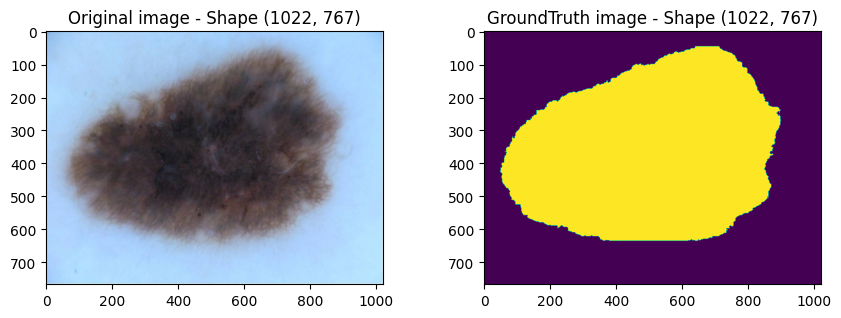

[  0 255]


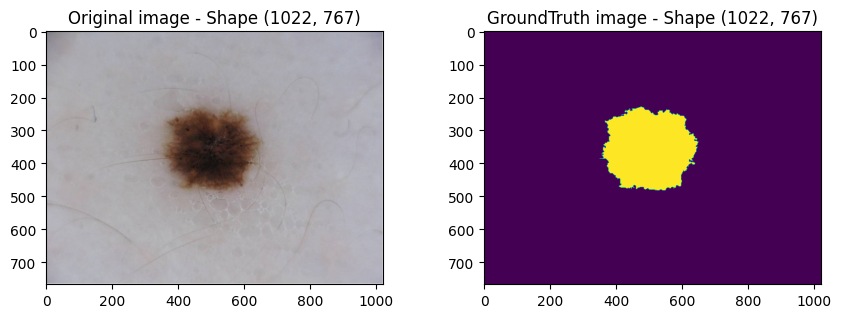

[  0 255]


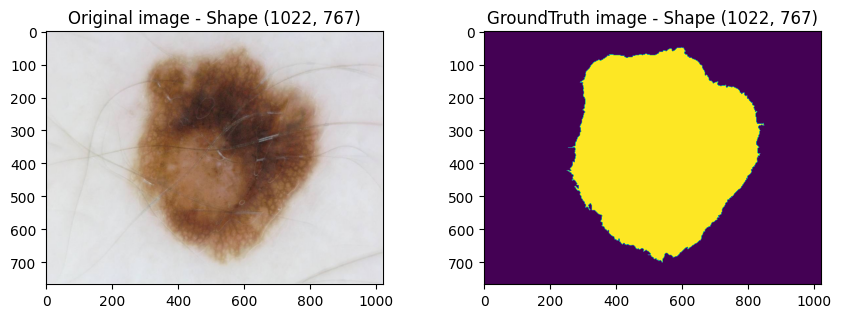

[  0 255]


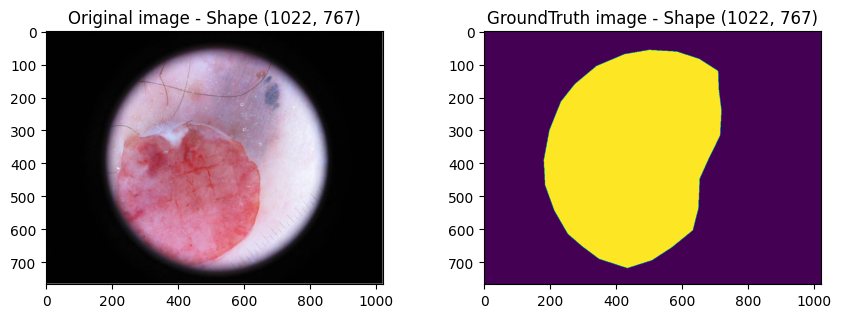

[  0 255]


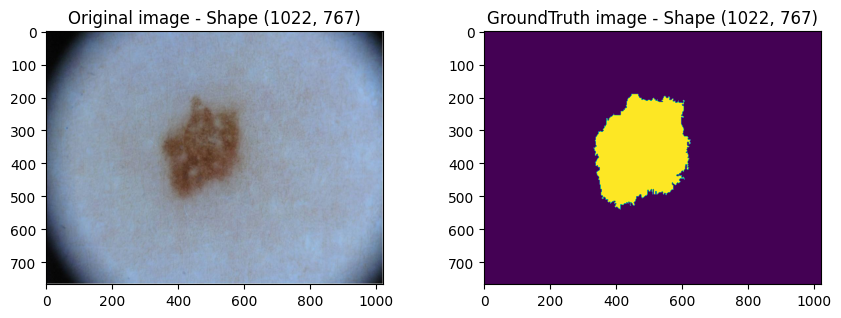

[  0 255]


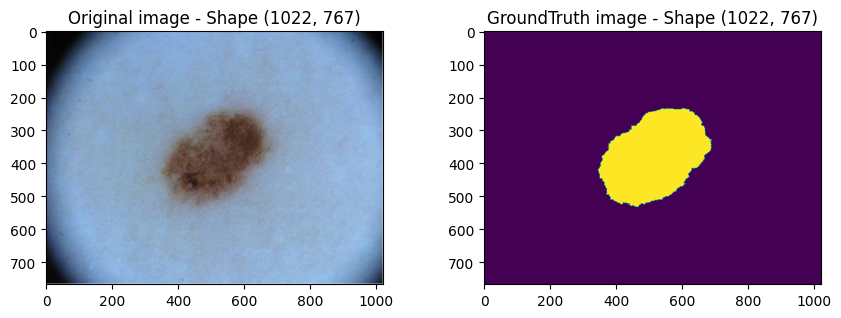

[  0 255]


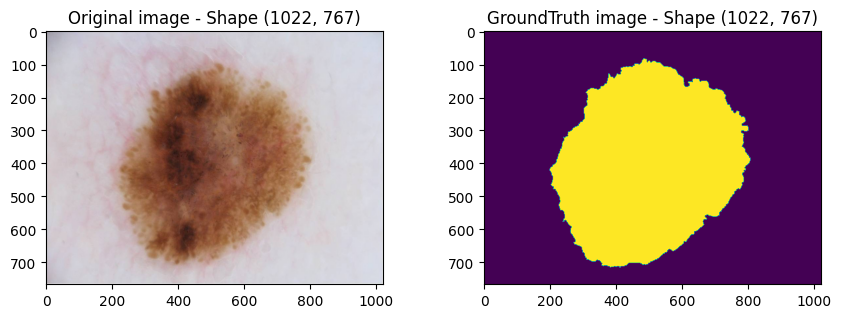

[  0 255]


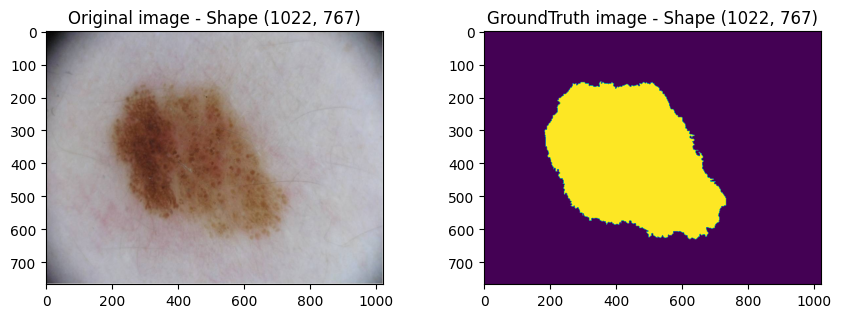

[  0 255]


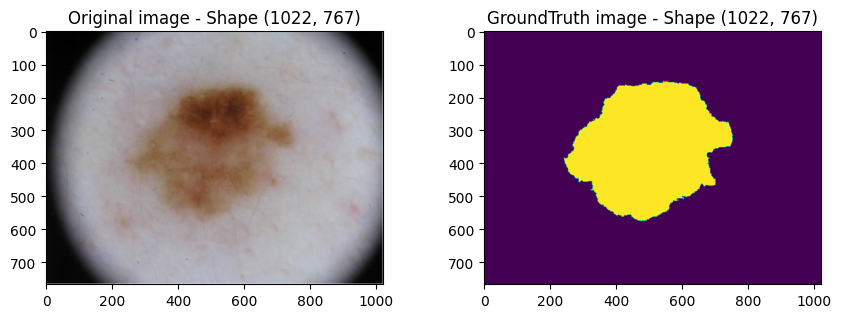

[  0 255]


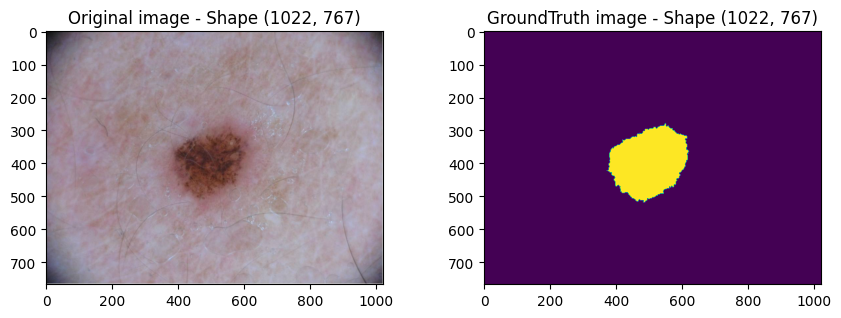

[  0 255]


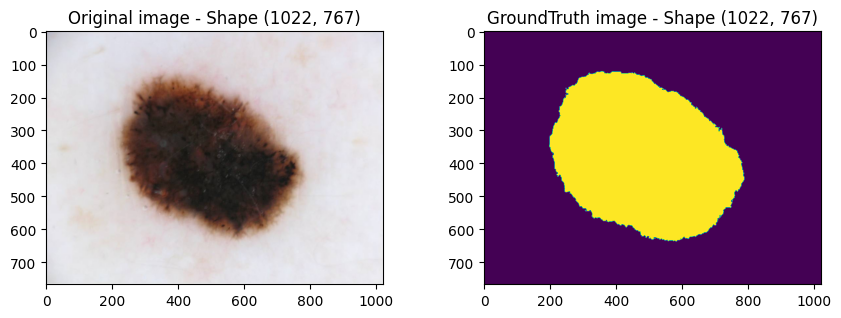

[  0 255]


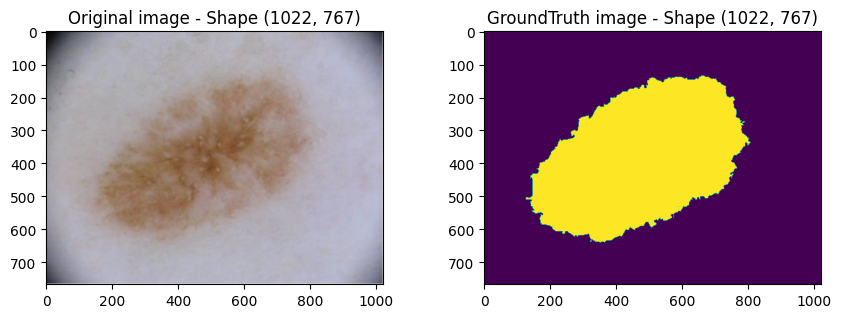

[  0 255]


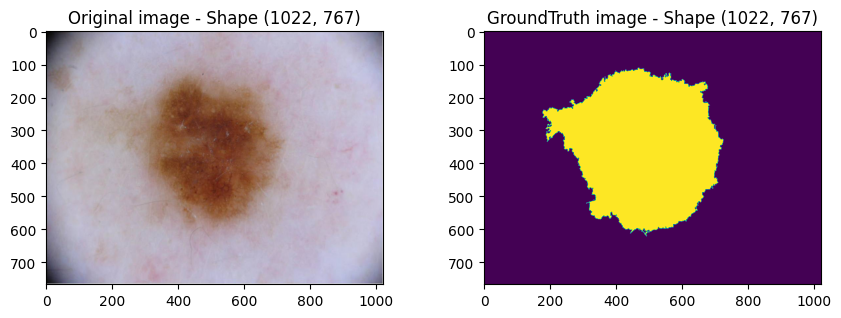

[  0 255]


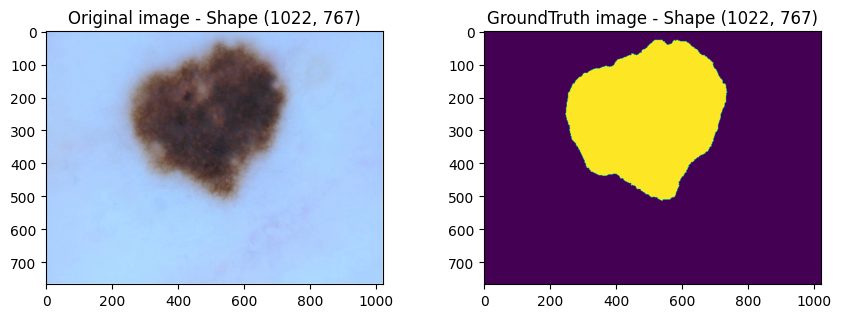

[  0 255]


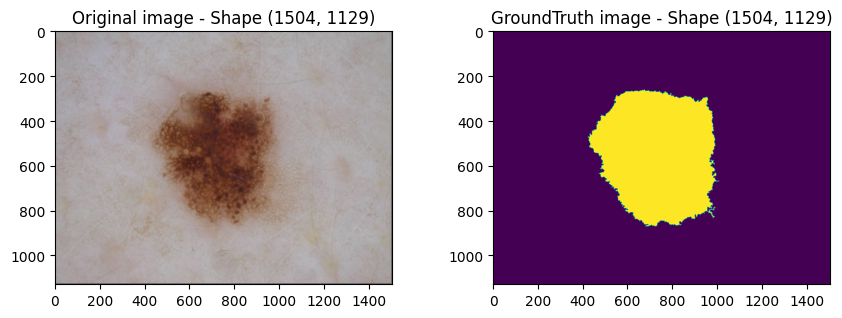

[  0 255]


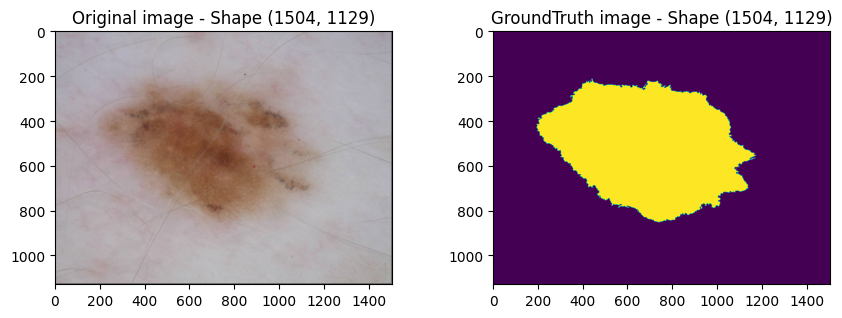

[  0 255]


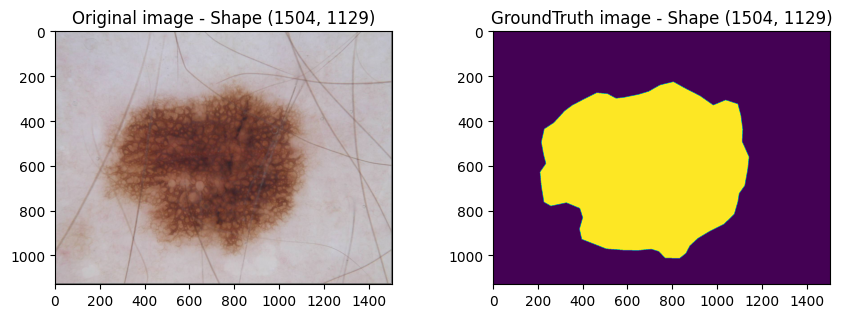

[  0 255]


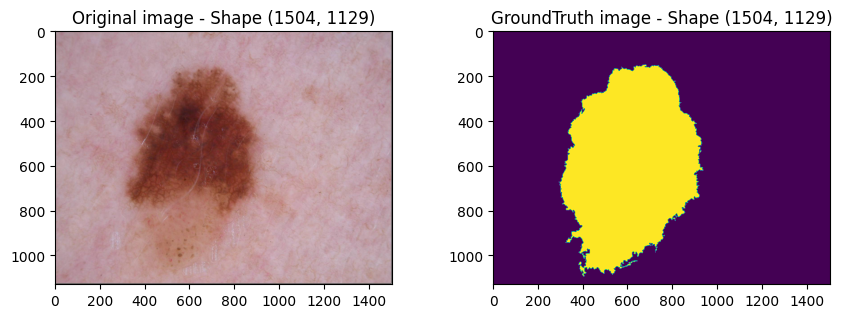

[  0 255]


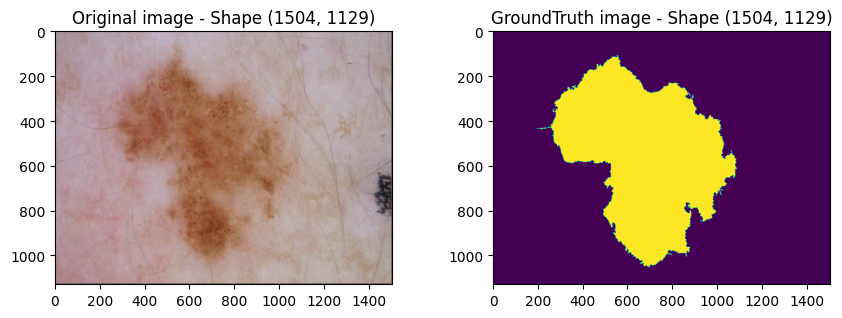

[  0 255]


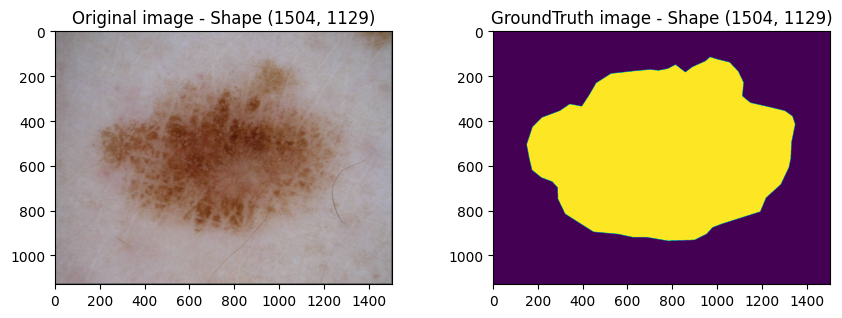

[  0 255]


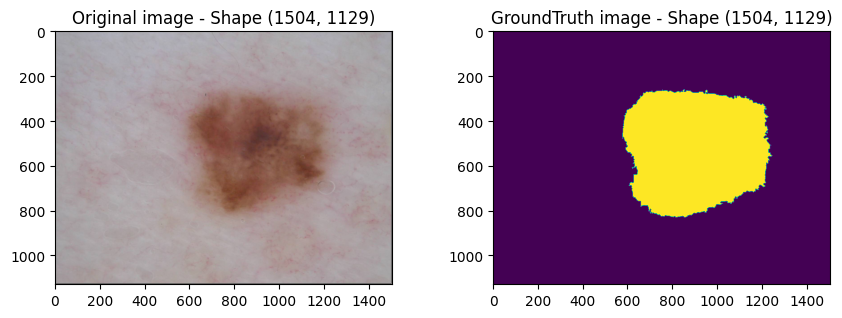

[  0 255]


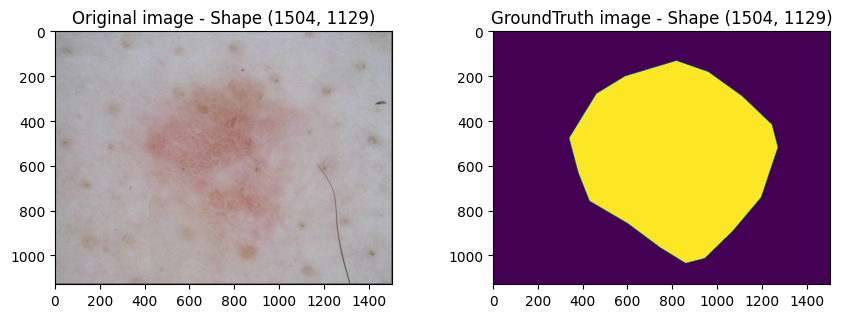

[  0 255]


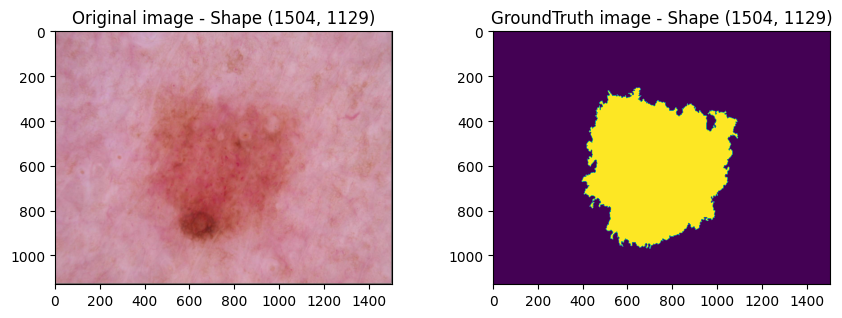

[  0 255]


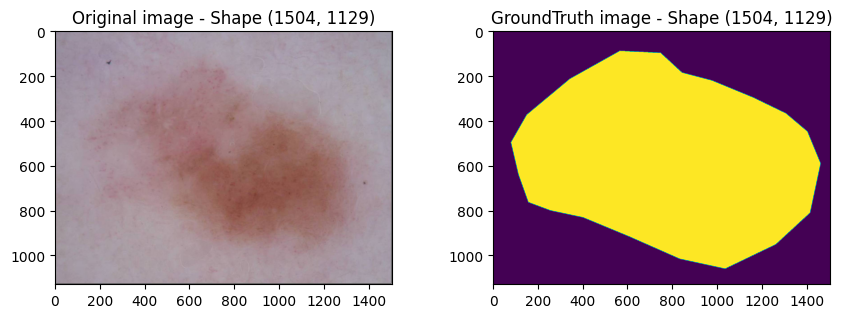

[  0 255]


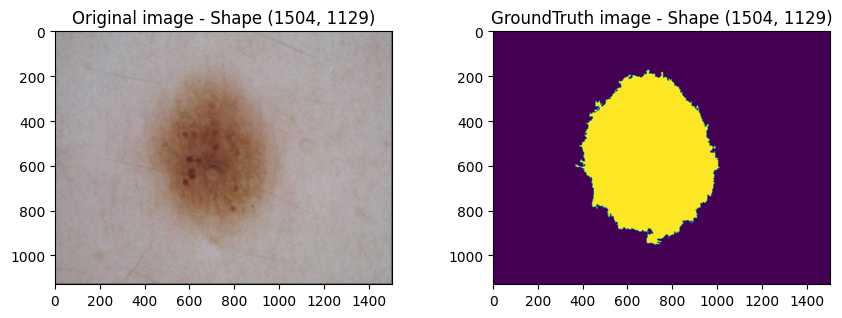

[  0 255]


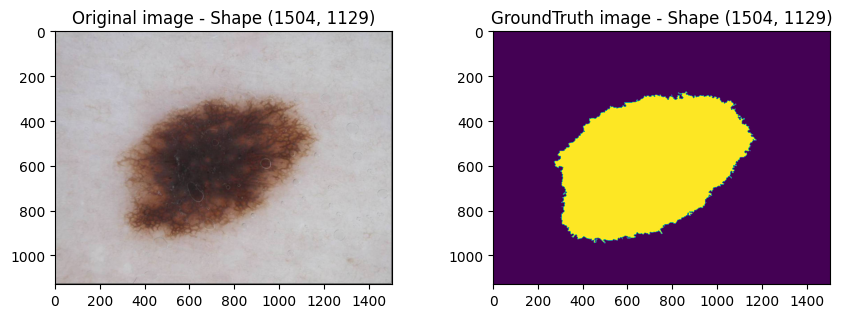

[  0 255]


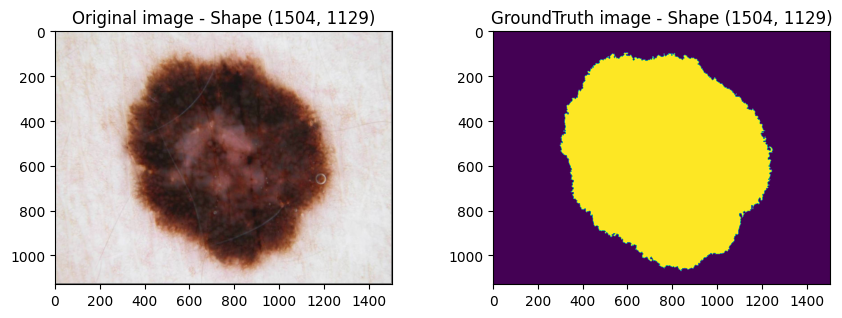

[  0 255]


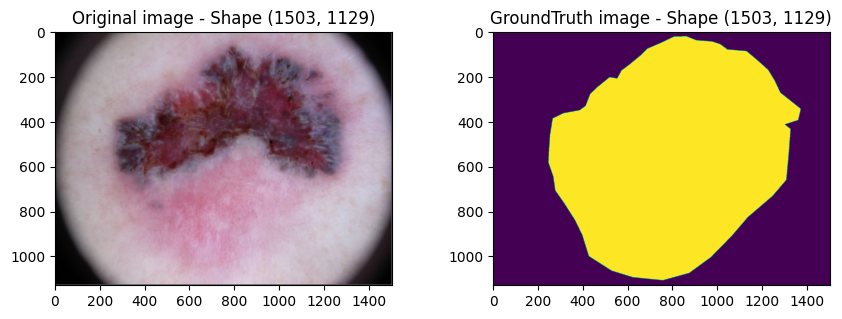

[  0 255]


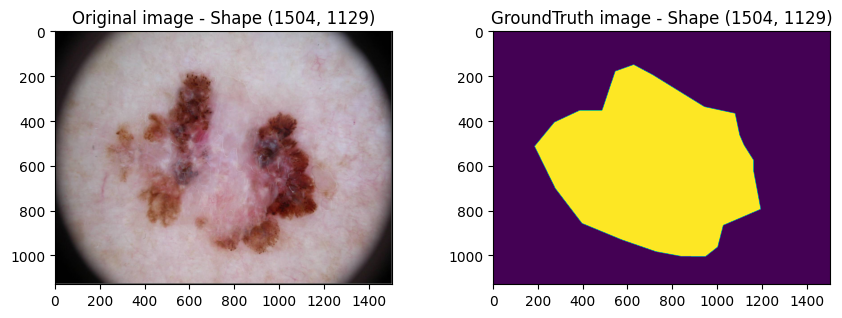

[  0 255]


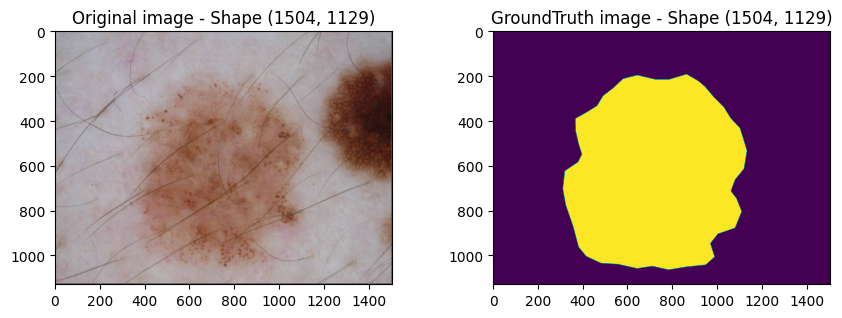

[  0 255]


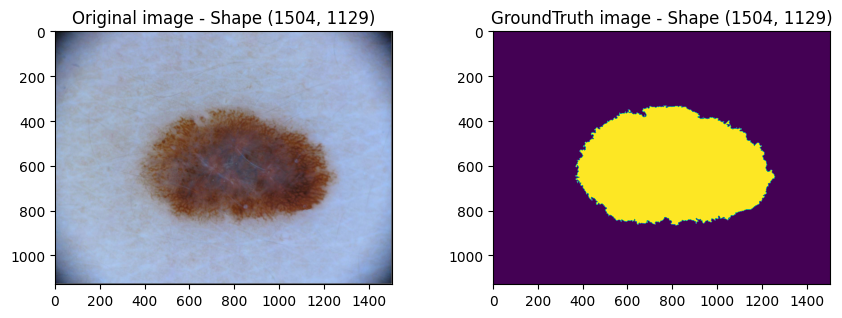

[  0 255]


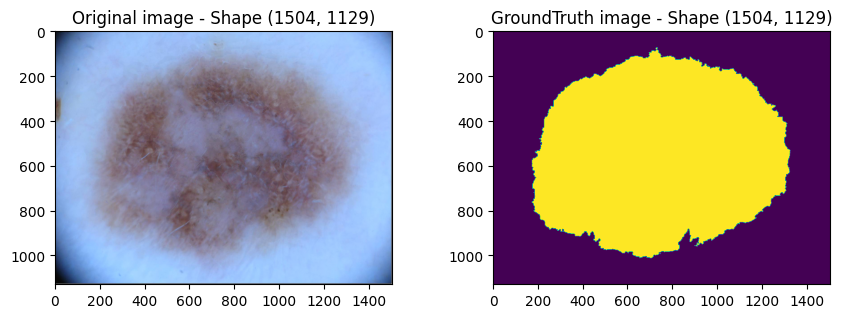

[  0 255]


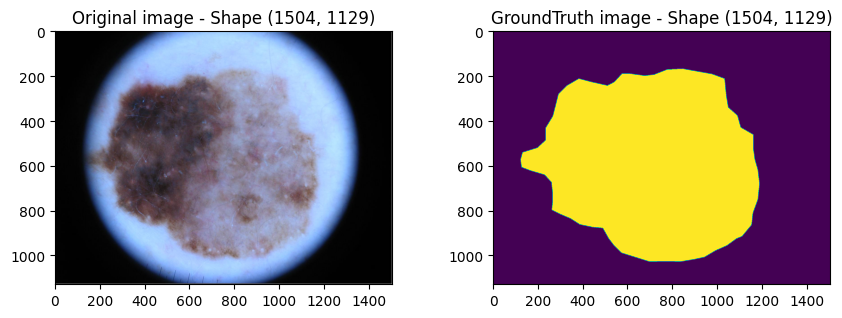

[  0 255]


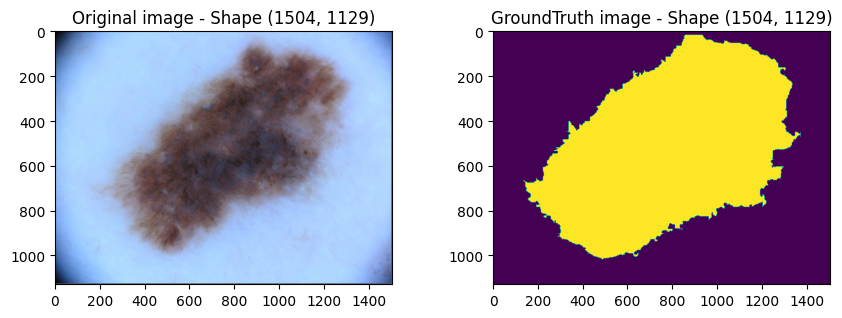

[  0 255]


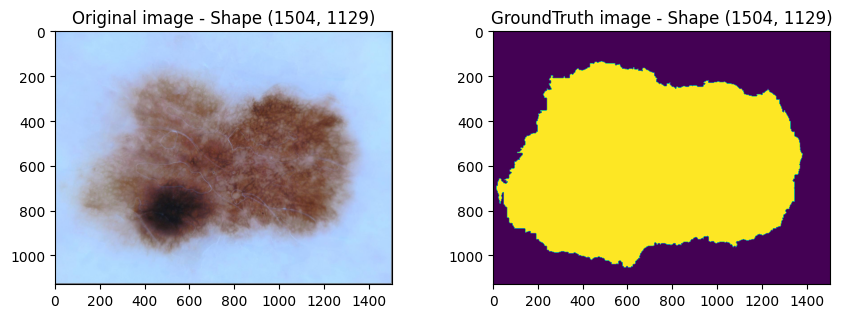

[  0 255]


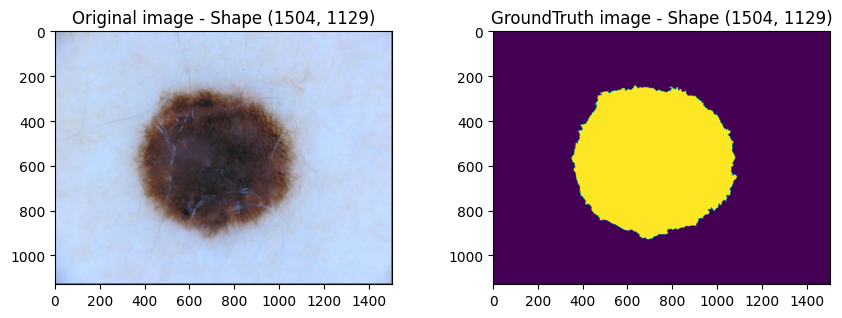

[  0 255]


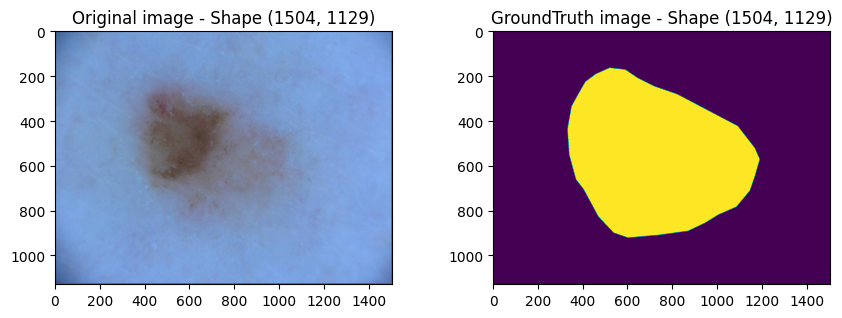

[  0 255]


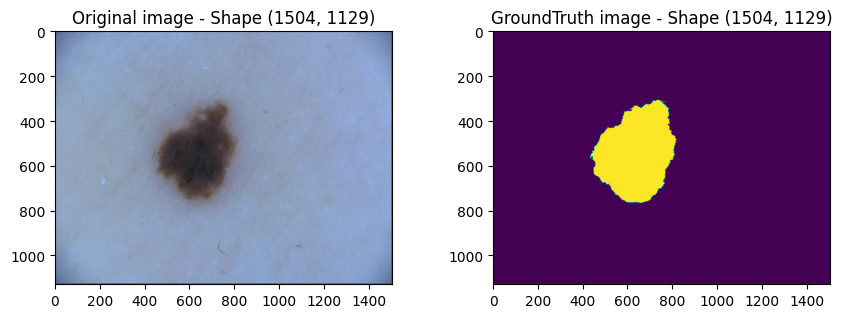

[  0 255]


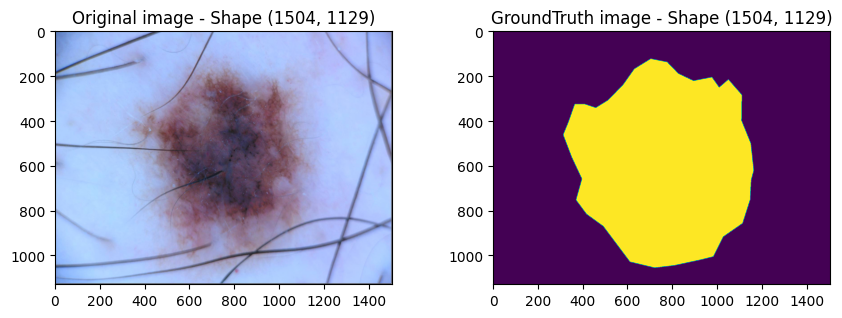

[  0 255]


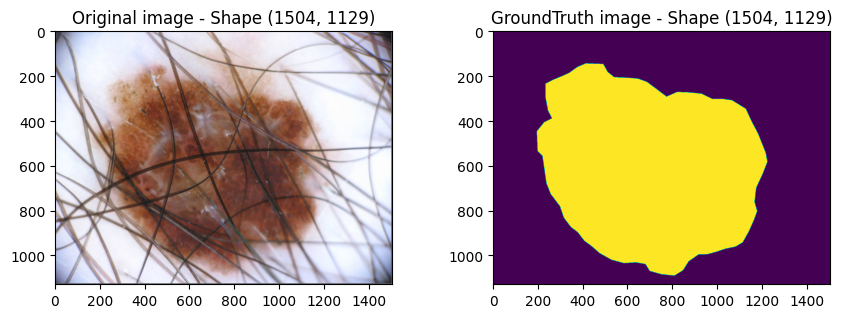

[  0 255]


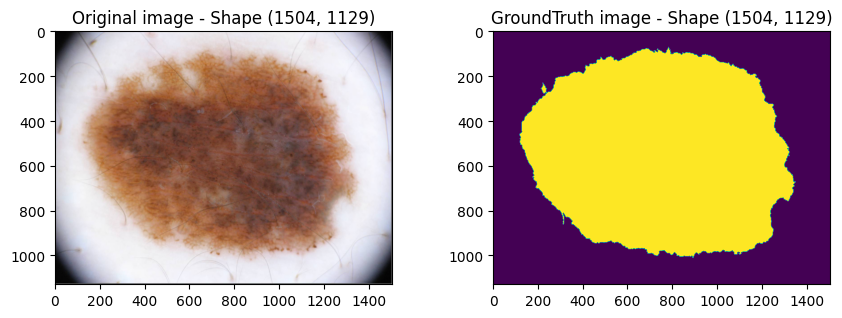

[  0 255]


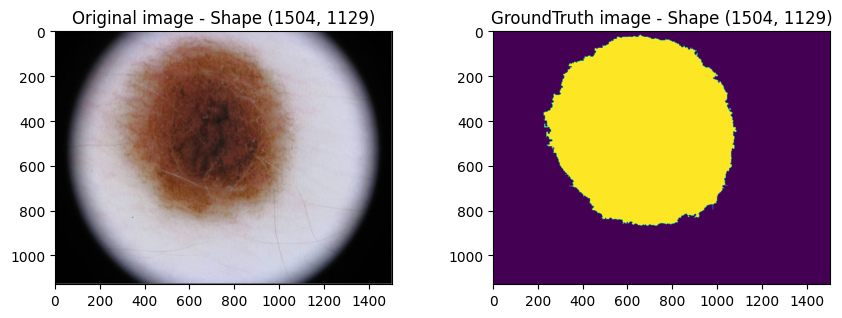

[  0 255]


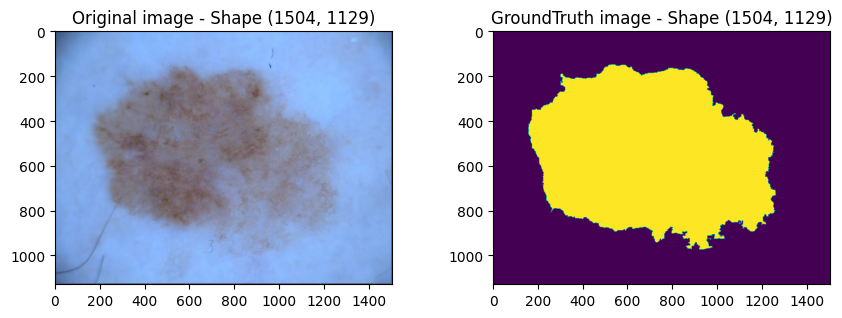

[  0 255]


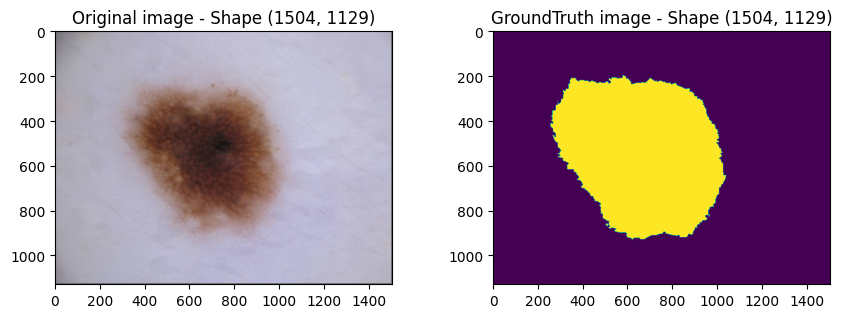

[  0 255]


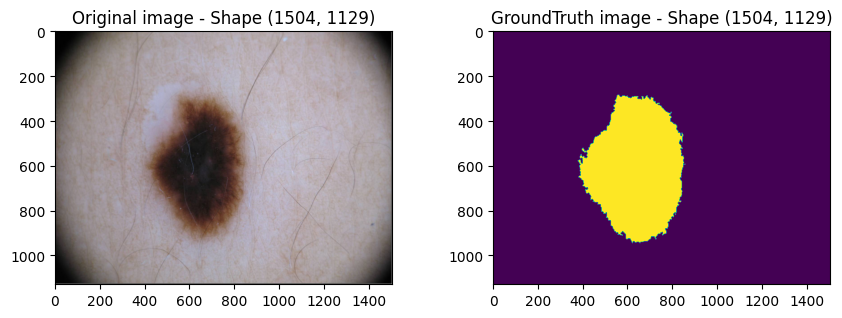

[  0 255]


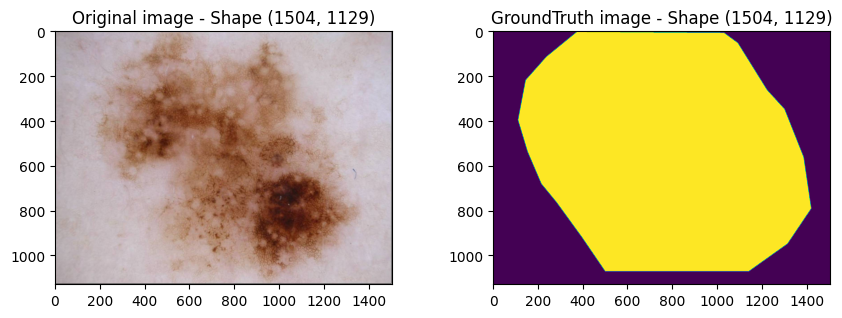

[  0 255]


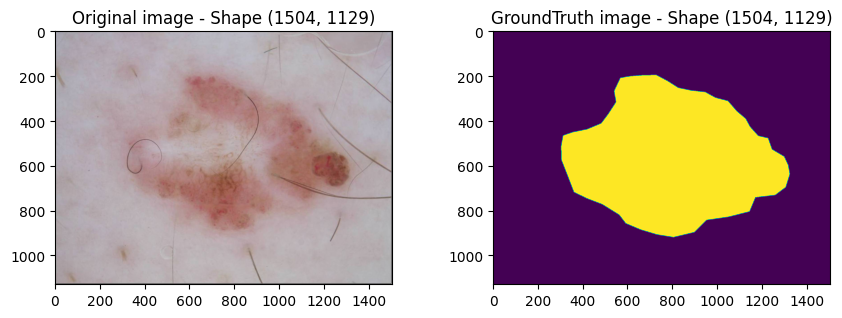

[  0 255]


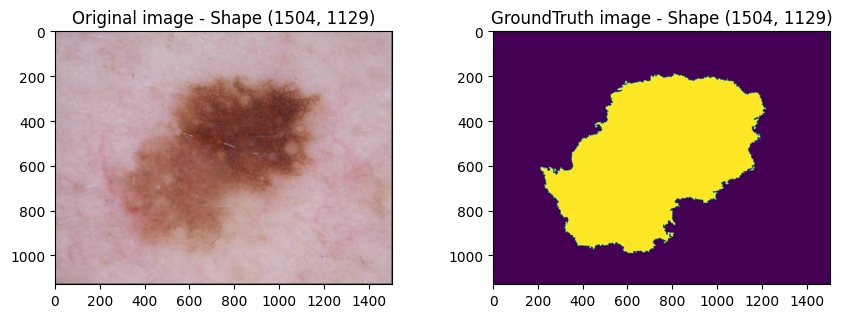

[  0 255]


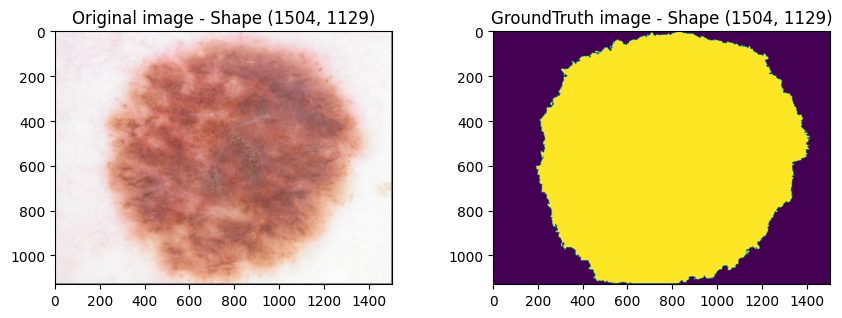

[  0 255]


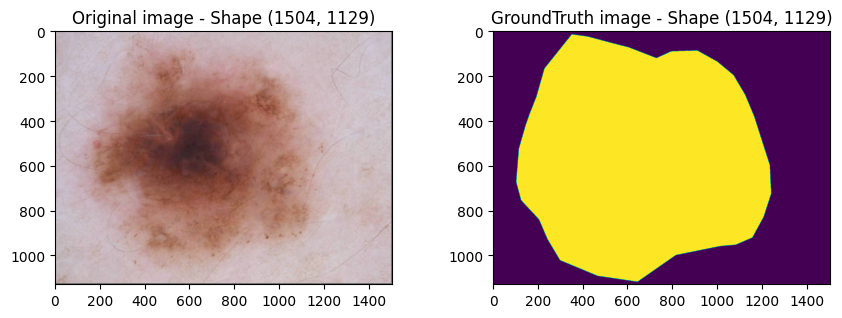

In [12]:
for idx in range(50):
    train_imgs, train_groundtruth_imgs = training_imgs[idx], training_groundtruth_imgs[idx]
    # Open the images
    train_img = Image.open(train_imgs)
    train_groundtruth_img = Image.open(train_groundtruth_imgs)

    # Create subplots
    fig, ax = plt.subplots(1, 2, figsize=(10, 7))
    
    # Display images with titles
    ax[0].imshow(train_img)
    ax[0].set_title(f"Original image - Shape {train_img.size}")
    ax[1].imshow(train_groundtruth_img)
    ax[1].set_title(f"GroundTruth image - Shape {train_groundtruth_img.size}")
    print(np.unique(np.array(train_groundtruth_img)))
    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.3, hspace=0.4)
    
    # Show the plot
    plt.show()


In [27]:
import cv2
import argparse
import os, sys
import numpy as np
from PIL import Image
from glob import glob

import torch
import albumentations as A
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

In [28]:
# Define root paths
__file__ = os.getcwd() + "/source"
_root = "/".join(__file__.split("/")[:-1]) + "/source/ISIC2018_Task1"
print(_root)

/media/mountHDD2/duong/git/ISIC_2018_Segmentation/dataset/source/ISIC2018_Task1


In [29]:
def read_data(image_path, mask_path):
    """Read image and mask from the given path"""
    try:
        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path))
    except Exception as e:
        print(f"Error reading image {image_path} or mask {mask_path}: {e}")
        raise  

    return image, mask

class CustomISIC2018(Dataset):
    def __init__(self, root: str = _root, split = "train", args: argparse = None):
        self.root = root
        self.args = args
        if self.args is None:
            raise ValueError("args can not be None")
        self._split = split
        self.__mode = split

        self.resize = A.Compose(
            [
                A.Resize(args.sz, args.sz),
            ]
        )

        if args.aug:
            self.augment = A.Compose([
                A.RandomRotate90(p=1),
                A.Transpose(p=1),
                A.GridDistortion(p=1),
                A.OpticalDistortion(p=1, distort_limit=2, shift_limit=0.5),
                A.VerticalFlip(p=1),
                A.HorizontalFlip(p=1),
                A.RandomBrightnessContrast(p=1),
                A.RandomGamma(p=1),
                A.HueSaturationValue(p=1),
                A.RGBShift(p=1),
                A.MotionBlur(p=1, blur_limit=7),
                A.MedianBlur(p=1, blur_limit=9),
                A.GaussianBlur(p=1, blur_limit=9),
                A.GaussNoise(p=1),
                A.ChannelShuffle(p=1),
                A.CoarseDropout(p=1, max_holes=8, max_height=32, max_width=32)
            ])
        else:
            self.augment = None  

        self.norm = A.Compose(
            [
                A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
            ]
        )

        self.images_dir = os.path.join(self.root, self._split)
        self.masks_dir = os.path.join(self.root, self._split + "_masks")
        # print(f"Images directory: {self.images_dir}")
        # print(f"Masks directory: {self.masks_dir}")

        self._images = sorted(glob(self.images_dir + "/*.jpg"))
        self._masks = sorted(glob(self.masks_dir + "/*.png"))

        if len(self._images) == 0 or len(self._masks) == 0:
            raise FileNotFoundError(f"No images or masks found in the directory.")

    @staticmethod
    def process_mask(x: torch.Tensor) -> torch.Tensor:
        uniques = torch.unique(x, sorted = True)
        if uniques.shape[0] > 3:
            x[x == 0] = uniques[2]
            uniques = torch.unique(x, sorted = True)
        for i, v in enumerate(uniques):
            x[x == v] = i
        
        x = x.to(dtype=torch.long)
        x_squeezed = x.squeeze(1)
        onehot = F.one_hot(x_squeezed, 3).permute(0, 3, 1, 2)[0].float()
        return onehot

    def __len__(self):
        return len(self._images)
    
    def __getitem__(self, idx):
        image = self._images[idx]
        mask = self._masks[idx]

        if not os.path.exists(image):
            raise FileNotFoundError(f"Image not found: {image}")
        if not os.path.exists(mask):
            raise FileNotFoundError(f"Mask not found: {mask}")
        
        x, y = read_data(image, mask)

        resized = self.resize(image=x, mask=y)

        if self.__mode == "train":
            transformed = self.augment(image=resized["image"], mask=resized["mask"])
            transformed_image = self.norm(image=transformed["image"])["image"]
            transformed_mask = transformed["mask"]
        else:
            transformed_image = self.norm(image=resized["image"])["image"]
            transformed_mask = resized["mask"]

        torch_img = torch.from_numpy(transformed_image).permute(-1, 0, 1).float()
        torch_mask = torch.from_numpy(transformed_mask).unsqueeze(-1).permute(-1, 0, 1).float()

        target = {
            "semantic" : self.process_mask(torch_mask),
            # "category" : self._labels[idx],
        }

        return torch_img, target
    
    @property
    def mode(self):
        return self.__mode
    
    @mode.setter
    def mode(self, m):
        if m not in ['train', 'valid', 'test']:
            raise ValueError(f"mode can not be {m} and must be ['train', 'valid', 'test']")
        else:
            self.__mode = m

In [30]:
def get_ds_isic2018(args):
    train_ds = CustomISIC2018(args=args, split="train")
    valid_ds = CustomISIC2018(args=args, split="valid")
    test_ds = CustomISIC2018(args=args, split="test")

    train_dl = DataLoader(train_ds, batch_size=args.bs, shuffle=True, pin_memory=args.pm, num_workers=args.wk)
    valid_dl = DataLoader(valid_ds, batch_size=args.bs, shuffle=True, pin_memory=args.pm, num_workers=args.wk)
    test_dl = DataLoader(test_ds, batch_size=args.bs, shuffle=True, pin_memory=args.pm, num_workers=args.wk)

    args.num_train_sample = len(train_ds)
    args.num_valid_sample = len(valid_ds)
    args.num_test_sample = len(test_ds)
    args.num_train_batch = len(train_dl)
    args.num_valid_batch = len(valid_dl)
    args.num_test_batch = len(test_dl)

    return (train_ds, valid_ds, test_ds, train_dl, valid_dl, test_dl), args

def get_ds(args):
    ds_mapping = {
        "isic2018" : get_ds_isic2018
    }

    data, args = ds_mapping[args.ds](args)

    return data, args

In [31]:
class Args:
    def __init__(self):
        # Dataset
        self.ds = "isic2018"
        self.bs = 32
        self.wk = 1
        self.pm = False
        self.sz = 256
        self.aug = False

        # Training
        self.idx = 0
        self.seed = 0
        self.epochs = 100
        self.model = "unet"
        self.loss = "cross_entropy"
        self.task = "seg"
        self.test = False

        # Logging
        self.wandb = False
        self.log = False
        self.wandb_prj = "ISIC2018 Segmentation"
        self.wandb_entity = "scalemind"
        self.neptune = False
        self.neptune_prj = "ISIC2018 Segmentation"
        self.neptune_api_token = None

        # Model
        self.init_ch = 32
        self.clf_n_classes = 37
        self.seg_n_classes = 3
        self.lr = 0.001

        # Loss hyperparameters
        self.alpha = 0
        self.gamma = 0
        self.smooth = 1.0
        self.epsilon = 1e-7
        self.weight = None
        self.ignore_index = -100
        self.reduction = "mean"


In [32]:
# Dataset setup
args = Args()
data, args = get_ds(args)
train_ds, valid_ds, _, train_dl, valid_dl, _ = data

In [35]:
print(len(train_ds))

img, msk = train_ds[0]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))

ax1.imshow(img.permute(1, -1, 0).numpy())
ax2.imshow(msk.permute(1, -1, 0).numpy(), cmap = 'gray')

2594


TypeError: 'NoneType' object is not callable